## Basic  Libray

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
df = pd.read_csv('Reviews.csv')

In [3]:
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568454 entries, 0 to 568453
Data columns (total 10 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   Id                      568454 non-null  int64 
 1   ProductId               568454 non-null  object
 2   UserId                  568454 non-null  object
 3   ProfileName             568438 non-null  object
 4   HelpfulnessNumerator    568454 non-null  int64 
 5   HelpfulnessDenominator  568454 non-null  int64 
 6   Score                   568454 non-null  int64 
 7   Time                    568454 non-null  int64 
 8   Summary                 568427 non-null  object
 9   Text                    568454 non-null  object
dtypes: int64(5), object(5)
memory usage: 43.4+ MB


In [5]:
df.Summary.head()

0    Good Quality Dog Food
1        Not as Advertised
2    "Delight" says it all
3           Cough Medicine
4              Great taffy
Name: Summary, dtype: object

In [6]:
df.Text.head()

0    I have bought several of the Vitality canned d...
1    Product arrived labeled as Jumbo Salted Peanut...
2    This is a confection that has been around a fe...
3    If you are looking for the secret ingredient i...
4    Great taffy at a great price.  There was a wid...
Name: Text, dtype: object

In [7]:
df.shape

(568454, 10)

## Data Preprocessing

In [ ]:
! pip install textblob

In [8]:
from nltk.corpus import stopwords
from textblob import TextBlob
from textblob import  Word
from nltk.stem import WordNetLemmatizer

In [9]:
wordnet = WordNetLemmatizer()

## Lower casing and punctuation marks

In [10]:
df['Text']  = df['Text'].apply(lambda x :" ".join(x.lower() for x in x.split()))

In [11]:
df['Text'][0]

'i have bought several of the vitality canned dog food products and have found them all to be of good quality. the product looks more like a stew than a processed meat and it smells better. my labrador is finicky and she appreciates this product better than most.'

In [12]:
df['Text']  = df['Text'].str.replace('[^\w\s]',"")
df['Text'].head(5)

<ipython-input-12-b259b4402400>:1: FutureWarning: The default value of regex will change from True to False in a future version.
  df['Text']  = df['Text'].str.replace('[^\w\s]',"")


0    i have bought several of the vitality canned d...
1    product arrived labeled as jumbo salted peanut...
2    this is a confection that has been around a fe...
3    if you are looking for the secret ingredient i...
4    great taffy at a great price there was a wide ...
Name: Text, dtype: object

### Removal the Stop Words

In [13]:
#remove the stopwords
stop = stopwords.words('english')
df['Text'] = df['Text'].apply(lambda x: " ".join(x for x in
x.split() if x not in stop))
df.Text.head()


0    bought several vitality canned dog food produc...
1    product arrived labeled jumbo salted peanutsth...
2    confection around centuries light pillowy citr...
3    looking secret ingredient robitussin believe f...
4    great taffy great price wide assortment yummy ...
Name: Text, dtype: object

In [14]:
#Lemmatization
df['Text'] = df['Text'].apply(lambda x: " ".join([Word(word).
lemmatize() for word in x.split()]))
df.Text.head()

0    bought several vitality canned dog food produc...
1    product arrived labeled jumbo salted peanutsth...
2    confection around century light pillowy citrus...
3    looking secret ingredient robitussin believe f...
4    great taffy great price wide assortment yummy ...
Name: Text, dtype: object

## Look at the Summany and Text columns using wordcloud

In [15]:
df.Score.value_counts()

5    363122
4     80655
1     52268
3     42640
2     29769
Name: Score, dtype: int64

In [17]:
from wordcloud import WordCloud

In [18]:
df.columns

Index(['Id', 'ProductId', 'UserId', 'ProfileName', 'HelpfulnessNumerator',
       'HelpfulnessDenominator', 'Score', 'Time', 'Summary', 'Text'],
      dtype='object')

<AxesSubplot:xlabel='Score', ylabel='count'>

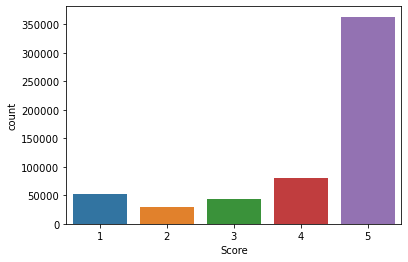

In [20]:
sns.countplot(data = df,x='Score' )

In [21]:
# create a new dataframe reviews to perform exploatory data analysis upon that
reviews = df
## dropping null values
reviews.dropna(inplace=True)

In [26]:
score_1 = reviews[reviews['Score']==1]
score_2 = reviews[reviews['Score']==2]
score_3 = reviews[reviews['Score']==3]
score_4 = reviews[reviews['Score']==4]
score_5 = reviews[reviews['Score']==5]



In [29]:
reviews_sample = pd.concat([score_1,score_2,score_3,score_4,score_5])
reviews_sample.reset_index(drop=True,inplace=True)

In [30]:
reviews_sample.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled jumbo salted peanutsth...
1,13,B0009XLVG0,A327PCT23YH90,LT,1,1,1,1339545600,My Cats Are Not Fans of the New Food,cat happily eating felidae platinum two year g...
2,27,B001GVISJM,A3RXAU2N8KV45G,lady21,0,1,1,1332633600,Nasty No flavor,candy red flavor plan chewy would never buy
3,51,B001EO5QW8,A108P30XVUFKXY,Roberto A,0,7,1,1203379200,Don't like it,oatmeal good mushy soft dont like quaker oat w...
4,63,B001EO5TPM,A1E09XGZUR78C6,gary sturrock,2,2,1,1215302400,stale product.,arrived 6 day stale could eat 6 bag


In [33]:
#Wordcloud function's input needs to be a single string of text.
# concatenating all Summaries into a single string.
# similarly you can build for Text column
reviews_str = reviews_sample.Summary.str.cat()

In [34]:
reviews_str

'Not as AdvertisedMy Cats Are Not Fans of the New FoodNasty No flavorDon\'t like itstale product.Warning!  WARNING!  -ALCOHOL SUGARS!No Tea FlavorBadRip off PriceTasteless but low calorieVery Low qualityNot Banana RuntsThese just don\'t do it for me as breath mintsCHANGED FORMULA MAKES CATS SICK!!!!Price cannot be correctNot GoodFurniture Polish TasteSad outcomeDon\'t Waste Your MoneyReeks like chemicalsLie!!!!Over priced chips and lack rice tasteSo awful I can barely describeVery Dissapointedwhat quantity is it!Never ArrivedAWFULDoes not taste very goodNo noBitterWaste of moneyMSG Ham Basepoor item packagingAwfuldisappointingLook elsewhere for your whole grainsMaybe the worst chips ever.Surprise 1  It\'s different...I have had better "Jalapeno Kettle Chips"They changed the Chips now they taste horribleGone down hillcompletely ripped offSTALE.  Beware buying these on special!USED to be my favorite chipsStale, Rancid Oil Taste, And if You Like Even the Tiniest Bit of Salt Flavor on Your

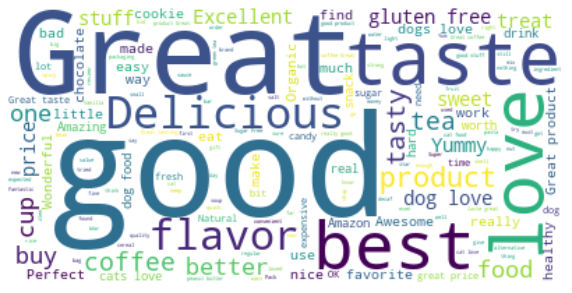

In [41]:
wordcloud = WordCloud(background_color='White').generate(reviews_str)
plt.figure(figsize=(10,10))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

In [45]:
# Now let's split the data Negative(score is 1 0r 2) and postive(score is 4 0r 5) reviews
negative_reviews = reviews_sample[reviews_sample['Score'].isin([1,2]) ]
positive_reviews =  reviews_sample[reviews_sample['Score'].isin([4,5])]

# transform into single string
negative_reviews_str = negative_reviews.Summary.str.cat()
positive_reviews_str = positive_reviews.Summary.str.cat()

In [46]:
negative_reviews_str

'Not as AdvertisedMy Cats Are Not Fans of the New FoodNasty No flavorDon\'t like itstale product.Warning!  WARNING!  -ALCOHOL SUGARS!No Tea FlavorBadRip off PriceTasteless but low calorieVery Low qualityNot Banana RuntsThese just don\'t do it for me as breath mintsCHANGED FORMULA MAKES CATS SICK!!!!Price cannot be correctNot GoodFurniture Polish TasteSad outcomeDon\'t Waste Your MoneyReeks like chemicalsLie!!!!Over priced chips and lack rice tasteSo awful I can barely describeVery Dissapointedwhat quantity is it!Never ArrivedAWFULDoes not taste very goodNo noBitterWaste of moneyMSG Ham Basepoor item packagingAwfuldisappointingLook elsewhere for your whole grainsMaybe the worst chips ever.Surprise 1  It\'s different...I have had better "Jalapeno Kettle Chips"They changed the Chips now they taste horribleGone down hillcompletely ripped offSTALE.  Beware buying these on special!USED to be my favorite chipsStale, Rancid Oil Taste, And if You Like Even the Tiniest Bit of Salt Flavor on Your

## Create WordCloud

Text(0.5, 1.0, 'wordclod_negative')

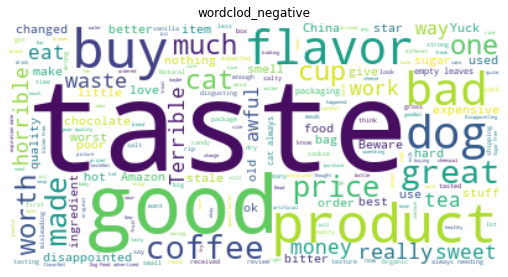

In [50]:
wordcloud_negative = WordCloud(background_color='White').generate(negative_reviews_str)
wordcloud_positive = WordCloud(background_color='White').generate(positive_reviews_str)

#plot
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(211)
ax.imshow(wordcloud_negative,interpolation = 'bilinear')
ax.axis('off')
ax.set_title('wordclod_negative')

Text(0.5, 1.0, 'wordclod_positive')

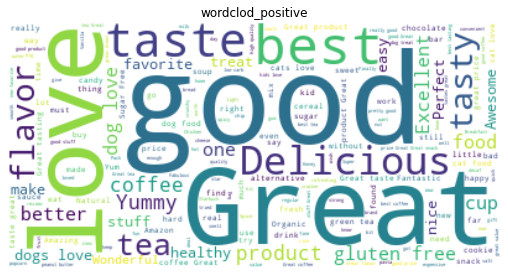

In [53]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(212)
ax.imshow(wordcloud_positive,interpolation = 'bilinear')
ax.axis('off')
ax.set_title('wordclod_positive')

## Sentiment Analysis: Pretrained model takes the input from the text description and outputs the sentiment score ranging from -1 to +1 for each sentence

### VADER (Valence Aware Dictionary and sEntiment Reasoner) is a lexicon and rule-based sentiment analysis tool that is specifically attuned to sentiments expressed in social media. VADER uses a combination of A sentiment lexicon is a list of lexical features (e.g., words) which are generally labeled according to their semantic orientation as either positive or negative. VADER not only tells about the Positive and Negative score but also tells us about how positive or negative a sentiment is.

In [56]:
! pip install vaderSentiment

In [61]:
import seaborn as sns
import os
import re
import sys
## Function for getting the Sentiment
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()

In [63]:
# Generating Sentiment for all the sentense present in the dataset
corpus = []
for row in df['Text']:
    vs = analyzer.polarity_scores(row)
    corpus.append(vs)
# creating new dataframe with sentiments
df_sentiments = pd.DataFrame(corpus)
df_sentiments.head()

,neg,neu,pos,compound
0,0.000,0.503,0.497,0.9413
1,0.129,0.762,0.110,-0.1027
2,0.130,0.587,0.283,0.8532
3,0.000,0.854,0.146,0.4404
4,0.000,0.369,0.631,0.9468


In [65]:
# Merging the sentiments back to review dataframe
df_c = pd.concat([df.reset_index(drop=True),df_sentiments],axis=1)
df_c.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,neg,neu,pos,compound
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,bought several vitality canned dog food produc...,0.000,0.503,0.497,0.9413
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled jumbo salted peanutsth...,0.129,0.762,0.110,-0.1027
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",confection around century light pillowy citrus...,0.130,0.587,0.283,0.8532
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,looking secret ingredient robitussin believe f...,0.000,0.854,0.146,0.4404
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy great price wide assortment yummy ...,0.000,0.369,0.631,0.9468


In [70]:
df_c['Sentiment']  = np.where(df_c['compound']>=0 ,'Positive','Negative')

In [71]:
df_c.head(5)

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,neg,neu,pos,compound,Sentiment
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,bought several vitality canned dog food produc...,0.000,0.503,0.497,0.9413,Positive
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled jumbo salted peanutsth...,0.129,0.762,0.110,-0.1027,Negative
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",confection around century light pillowy citrus...,0.130,0.587,0.283,0.8532,Positive
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,looking secret ingredient robitussin believe f...,0.000,0.854,0.146,0.4404,Positive
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy great price wide assortment yummy ...,0.000,0.369,0.631,0.9468,Positive


<AxesSubplot:>

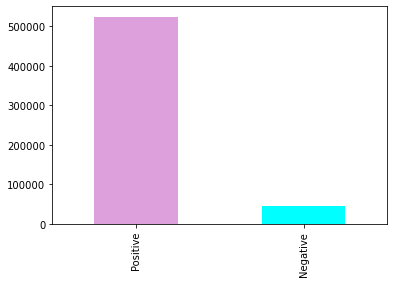

In [76]:
result = df_c['Sentiment'].value_counts()
result.plot(kind='bar',color=['plum','cyan'])